In [2]:

# Imports and Setup
import numpy as np
import pandas as pd
from IPython.display import display, HTML
import matplotlib
matplotlib.use('Agg')  # required for environments that need Agg backend
import matplotlib.pyplot as plt
plt.switch_backend('Agg')  # switch backend in case only plt is imported
get_ipython().run_line_magic('matplotlib', 'inline')
import seaborn as sns


file_path = "C:/Users/danin/OneDrive/2024_2025/3. Projects/cost_breakdown_analysis/Dummy_Database.xlsx" 
sheet_name = "Data"  # Specify the sheet name
# Read Excel file into DataFrame, skip unwanted rows
data = pd.read_excel(file_path, sheet_name=sheet_name, skiprows=2)

In [3]:
# Display the first few rows of the dataframe
print('Data shape:', data.shape)
list(data.columns)
#data.head()

Data shape: (18697, 34)


['Contract',
 'Assit Class',
 'Project',
 'Q',
 'Year',
 'Main Contract or Subcontract',
 'Bill No.',
 '1. Division',
 '2. Section',
 'Sort',
 '2a. Element (optional)',
 'BCIS (NRM) Level 1',
 'BCIS (NRM) Level 2',
 'BCIS (NRM) Level 3',
 'BCIS (NRM) Level 4',
 'NRM-1_Group element',
 'NRM-2_Facility',
 'CSI Format',
 'Item Level-1',
 'Item Level-2',
 '3. Main Description',
 '4. Size etc.',
 'Quantity',
 'Unit',
 'Unit Rate\n$',
 'Amount\n$',
 'Item Amount',
 'Range',
 'Converted Rate Calculation',
 'Converted Rate Unit',
 'Contrat Amount',
 'BUA (m2)',
 'Cost %',
 '$/m2']

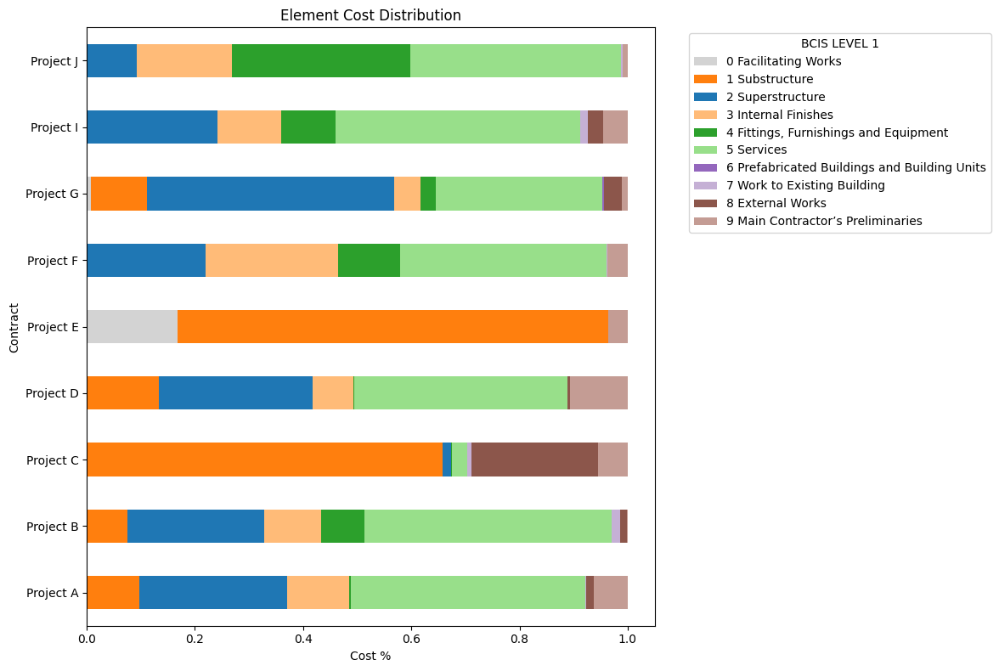

In [12]:
#NRM

data.columns = data.columns.str.strip().str.lower()
#data.head(5)

# Create a DataFrame
nrm = pd.DataFrame(data)

# Key variables to select
the_variables = ["contract","bcis (nrm) level 1","bcis (nrm) level 2", "assit class","cost %"]

# Select only the key variables
chosen_data = nrm[the_variables]

# Method 2: Modifying columns directly
chosen_data.columns = ['PROJECT', 'BCIS (NRM) LEVEL 1', 'BCIS (NRM) LEVEL 2', 'CLASSIFICATION', 'COST %']

#chosen_data.head(5)

# Group data to calculate Level 1 Cost % (sum of Level 2 costs)
grouped_df = chosen_data.groupby(['PROJECT', 'BCIS (NRM) LEVEL 1'])['COST %'].sum().unstack()

# Define colors for each BCIS Level 1 category
colors = ['#d3d3d3', '#ff7f0e', '#1f77b4', '#ffbb78', '#2ca02c', '#98df8a', '#9467bd', '#c5b0d5', '#8c564b', '#c49c94']

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

grouped_df.plot(kind='barh', stacked=True, ax=ax, color=colors)

# Set labels and title
ax.set_xlabel('Cost %')
ax.set_ylabel('Contract')
ax.set_title('Element Cost Distribution')

# Adjust layout and show legend
ax.legend(title='BCIS LEVEL 1', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Display the chart
plt.show()



In [13]:
# PRODUCT DATA
# Clean column names
data.columns = data.columns.str.strip().str.lower()

# Create a DataFrame
df = pd.DataFrame(data)

# Key variables to select
key_variables = ["contract","year","contrat amount","bua (m2)", "assit class"]

# Select only the key variables
selected_data = df[key_variables]

# Method 2: Modifying columns directly
selected_data.columns = ['PROJECT', 'YEAR', 'CONTRACT AMOUNT', 'GIFA (m2)', 'CLASSIFICATION']

# Removing duplicate projects while keeping only the first occurrence
selected_data = selected_data.drop_duplicates(subset=['PROJECT'])

# Format contract amount as currency
selected_data['CONTRACT AMOUNT'] = selected_data['CONTRACT AMOUNT'].apply(lambda x: f"${x:,.2f}")

# Sort projects based on Contract Amount in descending order
selected_data = selected_data.sort_values(by='PROJECT', ascending=True)

selected_data.head(10)
   

,PROJECT,YEAR,CONTRACT AMOUNT,GIFA (m2),CLASSIFICATION
0,Project A,2014,"$259,038,202.09",250000,Public Building
8371,Project B,2015,"$3,003,980.32",400000,Hospital
9560,Project C,2018,"$28,761,465.00",700000,Commercial
9703,Project D,2016,"$2,491,331.24",800000,Commercial
9152,Project E,2018,"$2,082,460.60",400000,Hospitality
9183,Project F,2018,"$320,787.05",250000,Residencial
10792,Project G,2021,"$44,480,654.82",200000,Commercial
18141,Project I,2021,"$607,051.32",150000,Mixed Use
10426,Project J,2020,"$318,414.10",20000,Bank


In [14]:
# COST BREAKDOWN STRUCTURE

# Create a DataFrame
cd = pd.DataFrame(data)

# Key variables to select
main_variables = ["contract","bcis (nrm) level 1","bcis (nrm) level 2","cost %"]

# Select only the key variables
cost_data = df[main_variables]

# Method 2: Modifying columns directly
cost_data.columns = ['PROJECT', 'BCIS (NRM) LEVEL 1', 'BCIS (NRM) LEVEL 2', 'COST %']

# Sort values by "BCIS (NRM) LEVEL 1" and "BCIS (NRM) LEVEL 2" (if needed)
cost_data = cost_data.sort_values(by=["BCIS (NRM) LEVEL 1", "BCIS (NRM) LEVEL 2"], ascending=True)

# Format the table for better readability in Jupyter Notebook
styled_cost_data = cost_data.style.set_table_styles(
    [{'selector': 'thead th',
      'props': [('background-color', '#222222'),
                ('color', 'white'),
                ('font-weight', 'bold')]},
     {'selector': 'tbody td',
      'props': [('background-color', '#333333'),
                ('color', 'white')]}]
).set_properties(**{'text-align': 'center'})

# Display the styled DataFrame
display(styled_cost_data)


In [15]:
# COST ANALYSIS

# Create a DataFrame from the provided data
ca = pd.DataFrame(data)

# Key variables to select
ca_variables = ["contract", "bcis (nrm) level 1", "cost %"]

# Select only the key variables
ca_data = ca[ca_variables]

# Rename columns for consistency
ca_data.columns = ['CONTRACT', 'BCIS (NRM) LEVEL 1', 'COST %']

# Ensure 'COST %' column is numeric for accurate calculations
ca_data["COST %"] = pd.to_numeric(ca_data["COST %"], errors="coerce").fillna(0)

# Group by BCIS (NRM) Level 1 to calculate the summed cost percentage
level_1_sums = ca_data.groupby("BCIS (NRM) LEVEL 1", as_index=False)["COST %"].sum()

# Rename columns for better readability
level_1_sums.rename(columns={"BCIS (NRM) LEVEL 1": "Level 1", "COST %": "Total Cost %"}, inplace=True)

# Display the final table
#print(level_1_sums)


C:\Users\danin\AppData\Local\Temp\ipykernel_14852\413614903.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ca_data["COST %"] = pd.to_numeric(ca_data["COST %"], errors="coerce").fillna(0)
